<a href="https://colab.research.google.com/github/czhangg17/COVID-19/blob/master/Punto_8_Prueba_Quantum.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## 8.	Utilizando el mismo conjunto de datos del punto 8, implemente un modelo de aprendizaje automático que dadas ciertas variables sociodemográficas y del tipo de asesinato policiaco, permita predecir la raza de la persona

Implementaremos a continuación el algoritmo de árboles de decisión con el fin de clasificar a un individuo y poder precedecir la raza segun vaariables sociodemográficas y el tipo de asesinato policiaco.

In [1]:
# librerias

import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
%matplotlib inline

plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from IPython.display import Image as PImage
from subprocess import check_call
from PIL import Image, ImageDraw, ImageFont
from sklearn.model_selection import train_test_split

In [2]:
# para las imagenes
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [3]:
from sklearn.metrics import confusion_matrix, classification_report

In [4]:
from google.colab import drive
#drive.mount('/content/drive')
PATH = '/content/drive/My Drive/Trabajo de Grado/AsesinadoPolicial.xlsx' 
drive.mount('/content/drive')
data=pd.read_excel(PATH)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


eliminamos algunas variables que no son de interés y las volvemos varaibles dummie, y hacemos una tranformación a los datos, la inputacion de valores vacíos en la edad fue con el promedio, mientras que la raza que no estaba llena no se tenia en cuenta.

In [5]:
data=data.drop(['id','name','date','city','flee','body_camera','signs_of_mental_illness','armed'],axis=1)


In [6]:
dummies=pd.get_dummies(data)
np.shape(dummies)

(2340, 65)

In [7]:
variables_x=list(dummies)
variables_y=variables_x[5:10]
del variables_x[5:10]

In [8]:
feature_cols=['age',
 'manner_of_death_shot',
 'manner_of_death_shot and Tasered',
 'gender_F',
 'gender_M',
 'state_AK',
 'state_AL',
 'state_AR',
 'state_AZ',
 'state_CA',
 'state_CO',
 'state_CT',
 'state_DC',
 'state_DE',
 'state_FL',
 'state_GA',
 'state_HI',
 'state_IA',
 'state_ID',
 'state_IL',
 'state_IN',
 'state_KS',
 'state_KY',
 'state_LA',
 'state_MA',
 'state_MD',
 'state_ME',
 'state_MI',
 'state_MN',
 'state_MO',
 'state_MS',
 'state_MT',
 'state_NC',
 'state_ND',
 'state_NE',
 'state_NH',
 'state_NJ',
 'state_NM',
 'state_NV',
 'state_NY',
 'state_OH',
 'state_OK',
 'state_OR',
 'state_PA',
 'state_RI',
 'state_SC',
 'state_SD',
 'state_TN',
 'state_TX',
 'state_UT',
 'state_VA',
 'state_VT',
 'state_WA',
 'state_WI',
 'state_WV',
 'state_WY',
 'threat_level_attack',
 'threat_level_other',
 'threat_level_undetermined']

In [9]:
#feature_cols=variables_x
Y=data['race']
X=dummies[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1) # 70% training and 30% test

In [10]:
#creando el arbol bajo criterio de la entropia para sus particiones
clf = DecisionTreeClassifier(criterion='entropy')


In [11]:
#ajusta el modelo de arbol de decision sin ningun criterio de optimizacion
clf=clf.fit(X_train,y_train)

In [12]:
#valores predichos
y_pred = clf.predict(X_test)

In [13]:
# % de Accuracy del modelo
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.4843304843304843


In [14]:
#visualizacion del arbol
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(X),class_names=['A','B','H','N','O','W'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

In [15]:
graph.write_png('arbol_sin_opt.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.733059 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.733059 to fit



In [16]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[  1   2   3   0   1   5]
 [  4  71  37   2   1  79]
 [  2  27  55   0   2  31]
 [  0   1   2   1   0   7]
 [  0   0   1   0   2   4]
 [  9  91  46   2   3 210]]
              precision    recall  f1-score   support

           A       0.06      0.08      0.07        12
           B       0.37      0.37      0.37       194
           H       0.38      0.47      0.42       117
           N       0.20      0.09      0.13        11
           O       0.22      0.29      0.25         7
           W       0.62      0.58      0.60       361

    accuracy                           0.48       702
   macro avg       0.31      0.31      0.31       702
weighted avg       0.49      0.48      0.49       702



# Optimización o poda del árbol

Dado que es imposible visualizar el árbol de decisión pero si realiza la predicción con apenas un accuracy del 48% vamos a realizar una poda en el árbol para simplificar el modelo.

In [17]:
#Bajo el mismo criterio de la entropia escogemos solo como maximo 10 hojas y 10 nodos y una profundidad de 6 niveles
clf = DecisionTreeClassifier(criterion='entropy',
                                            min_samples_split=10,
                                            min_samples_leaf=10,
                                            max_depth = 6)


clf = clf.fit(X_train,y_train)


y_pred = clf.predict(X_test)

In [18]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5555555555555556


In [19]:
from sklearn.metrics import confusion_matrix, classification_report
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[  0   0   2   0   0  10]
 [  0  53  24   0   0 117]
 [  0   8  52   0   0  57]
 [  0   2   1   0   0   8]
 [  0   1   1   0   0   5]
 [  0  44  32   0   0 285]]
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        12
           B       0.49      0.27      0.35       194
           H       0.46      0.44      0.45       117
           N       0.00      0.00      0.00        11
           O       0.00      0.00      0.00         7
           W       0.59      0.79      0.68       361

    accuracy                           0.56       702
   macro avg       0.26      0.25      0.25       702
weighted avg       0.52      0.56      0.52       702



/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


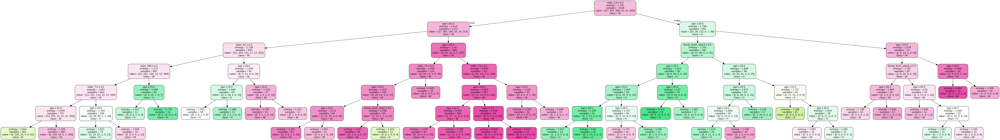

In [20]:
#visualizacion del arbol
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(X),class_names=['A','B','H','N','O','W'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  

graph.write_png('arbol_opt.png')
Image(graph.create_png())

Podemos concluir que pueden haber mejores modelos de machine learning que realicen la predicción, sin embargo al tomar de entrada el árbol de decisión permite explorar como método de clasificación un algoritmo supervisado para la solución de este tipo de problema.Pues, se podría intentar con algoritmos de bagging como el random forest o simplemente una regresion logistica multinomial.
